In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import zipfile
!unzip "/content/drive/MyDrive/Colab Notebooks/source 2.zip"


Streaming output truncated to the last 5000 lines.
  inflating: source 2/Very mild Dementia/OAS1_0042_MR1_mpr-3_136.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0238_MR1_mpr-2_115.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0164_MR1_mpr-4_101.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0290_MR1_mpr-4_114.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0352_MR1_mpr-2_105.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0247_MR1_mpr-1_150.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0312_MR1_mpr-1_133.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0339_MR1_mpr-1_154.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0380_MR1_mpr-3_100.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0339_MR1_mpr-4_151.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0046_MR1_mpr-1_111.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0298_MR1_mpr-1_131.jpg  
  inflating: source 2/Very mild Dementia/OAS1_0263_MR1_mpr-3_113.jpg  
  inflating: source 2/Very

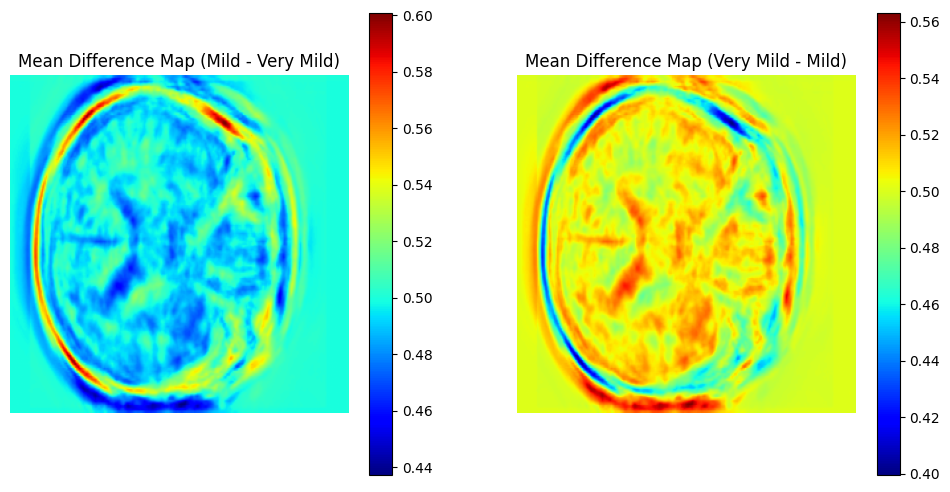

In [ ]:
import os
import glob
import random
import numpy as np
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from skimage.measure import label, regionprops


def compute_mean_image(dataloader):
    """
    Compute the pixel-wise mean image from all batches in the dataloader.
    Assumes each batch is a tensor of shape [batch_size, channels, height, width].
    """
    sum_image = None
    total_images = 0
    for batch in dataloader:
        if sum_image is None:
            sum_image = batch.sum(dim=0)
        else:
            sum_image += batch.sum(dim=0)
        total_images += batch.size(0)
    mean_image = sum_image / total_images
    return mean_image

class SimpleDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform
    def __len__(self):
        return len(self.image_paths)
    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('L')
        if self.transform:
            image = self.transform(image)
        return image

img_size = 256
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

dataset_very_mild_paths = glob.glob(os.path.join('/content/source 2/Very mild Dementia', '*.jpg'))
dataset_mild_paths = glob.glob(os.path.join('/content/source 2/Mild Dementia', '*.jpg'))

dataset_very_mild_simple = SimpleDataset(dataset_very_mild_paths, transform=transform)
dataset_mild_simple = SimpleDataset(dataset_mild_paths, transform=transform)

batch_size_simple = 8
very_mild_loader = DataLoader(dataset_very_mild_simple, batch_size=batch_size_simple, shuffle=False, num_workers=2)
mild_loader = DataLoader(dataset_mild_simple, batch_size=batch_size_simple, shuffle=False, num_workers=2)

mean_very_mild = compute_mean_image(very_mild_loader)
mean_mild = compute_mean_image(mild_loader)

difference_map_mild_minus_very_mild = mean_mild - mean_very_mild

difference_map_very_mild_minus_mild = mean_very_mild - mean_mild


diff_vis_mild_minus_very_mild = difference_map_mild_minus_very_mild * 0.5 + 0.5
diff_vis_very_mild_minus_mild = difference_map_very_mild_minus_mild * 0.5 + 0.5


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.imshow(diff_vis_mild_minus_very_mild.squeeze().detach().cpu().numpy(), cmap='jet')
plt.title('Mean Difference Map (Mild - Very Mild)')
plt.axis('off')
plt.colorbar()


plt.subplot(1, 2, 2)
plt.imshow(diff_vis_very_mild_minus_mild.squeeze().detach().cpu().numpy(), cmap='jet')
plt.title('Mean Difference Map (Very Mild - Mild)')
plt.axis('off')
plt.colorbar()

plt.show()


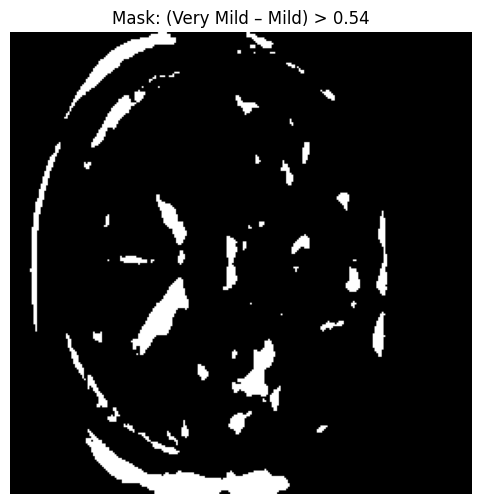

In [ ]:

diff_np = diff_vis_very_mild_minus_mild.squeeze().cpu().numpy()

mask_vm_minus_m = (diff_np > 0.52).astype(np.uint8)

plt.figure(figsize=(6, 6))
plt.imshow(mask_vm_minus_m, cmap='gray')
plt.title('Mask: (Very Mild – Mild) > 0.54')
plt.axis('off')
plt.show()


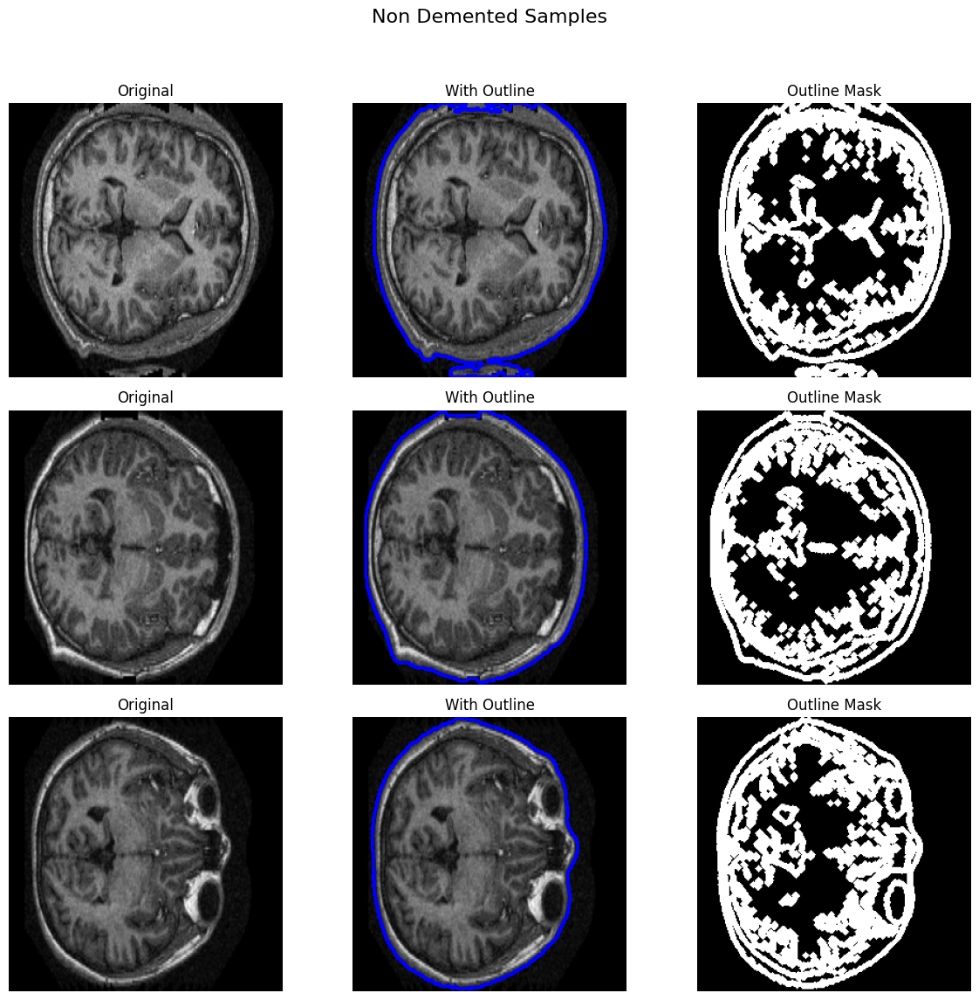

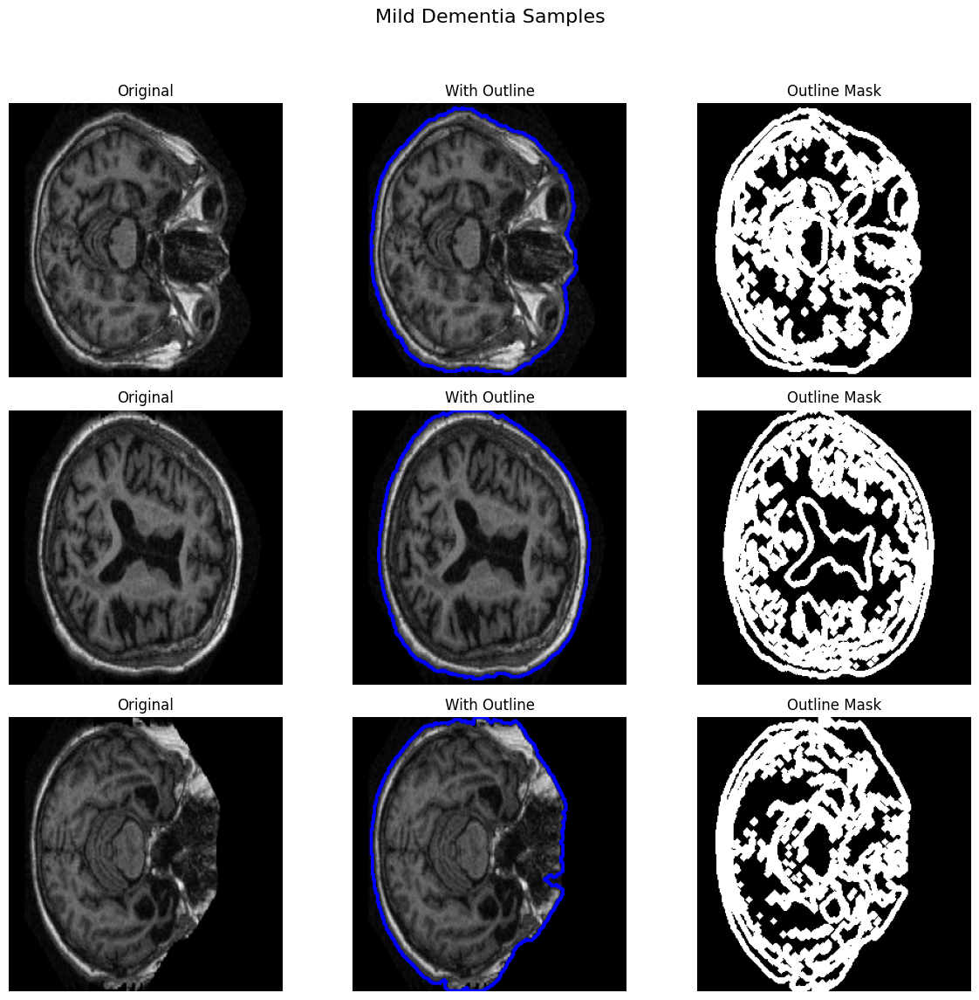

In [ ]:
import os
import glob
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from skimage.measure import label, regionprops

img_size = 256

def get_brain_segmentation(image_np):
    """
    Given a grayscale image (numpy array, range 0-255), use Otsu's method to segment the brain.
    Invert threshold if necessary, so that the brain region is white (255) and the background is black (0).
    """
    image_uint8 = image_np.astype(np.uint8)
    ret, thresh = cv2.threshold(image_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if np.mean(thresh) > 127:
        thresh = cv2.bitwise_not(thresh)
    return thresh

def get_brain_outline(image_np, thickness=3):
    """
    Compute the brain segmentation and then return its outline by subtracting the eroded mask
    from the dilated mask. The result is a binary mask that only contains the outer border (frame)
    of the brain segmentation.
    """
    brain_mask = get_brain_segmentation(image_np)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    dilated = cv2.dilate(brain_mask, kernel, iterations=thickness)
    eroded = cv2.erode(brain_mask, kernel, iterations=thickness)
    outline = cv2.subtract(dilated, eroded)
    outline = np.where(outline > 0, 1, 0).astype(np.uint8)
    return outline

def process_and_visualize(image_path):
    """
    Load an image, compute its brain outline (frame mask), and return:
      - The original grayscale image,
      - A color version with the outline overlaid,
      - The outline mask.
    """
    img = Image.open(image_path).convert('L').resize((img_size, img_size))
    img_np = np.array(img)

    outline_mask = get_brain_outline(img_np, thickness=3)


    img_color = cv2.cvtColor(img_np, cv2.COLOR_GRAY2BGR)
    contours, _ = cv2.findContours((outline_mask*255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img_color, contours, -1, (255, 0, 0), 2)

    return img_np, img_color, outline_mask

def visualize_samples(sample_paths, class_title):
    """
    Visualize 3 random samples from the provided image paths, showing:
      - Original image,
      - Image with the brain outline overlaid,
      - The outline (frame) mask.
    """
    sample_paths = random.sample(sample_paths, 3)
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    fig.suptitle(class_title, fontsize=16)
    for i, path in enumerate(sample_paths):
        img_np, img_overlay, outline_mask = process_and_visualize(path)
        if img_np is None:
            continue
        axes[i, 0].imshow(img_np, cmap='gray')
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')
        axes[i, 1].imshow(cv2.cvtColor(img_overlay, cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title("With Outline")
        axes[i, 1].axis('off')
        axes[i, 2].imshow(outline_mask, cmap='gray')
        axes[i, 2].set_title("Outline Mask")
        axes[i, 2].axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

dataset_very_mild_paths = glob.glob(os.path.join('/content/source 2/Non Demented', '*.jpg'))
dataset_mild_paths = glob.glob(os.path.join('/content/source 2/Mild Dementia', '*.jpg'))

visualize_samples(dataset_very_mild_paths, "Non Demented Samples")
visualize_samples(dataset_mild_paths, "Mild Dementia Samples")


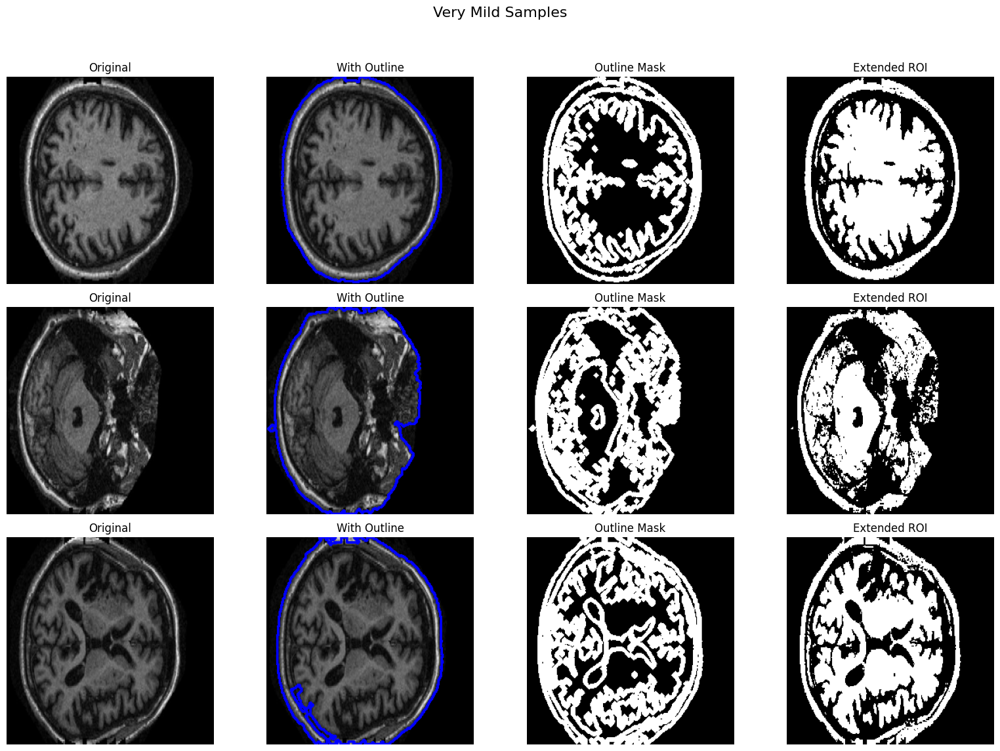

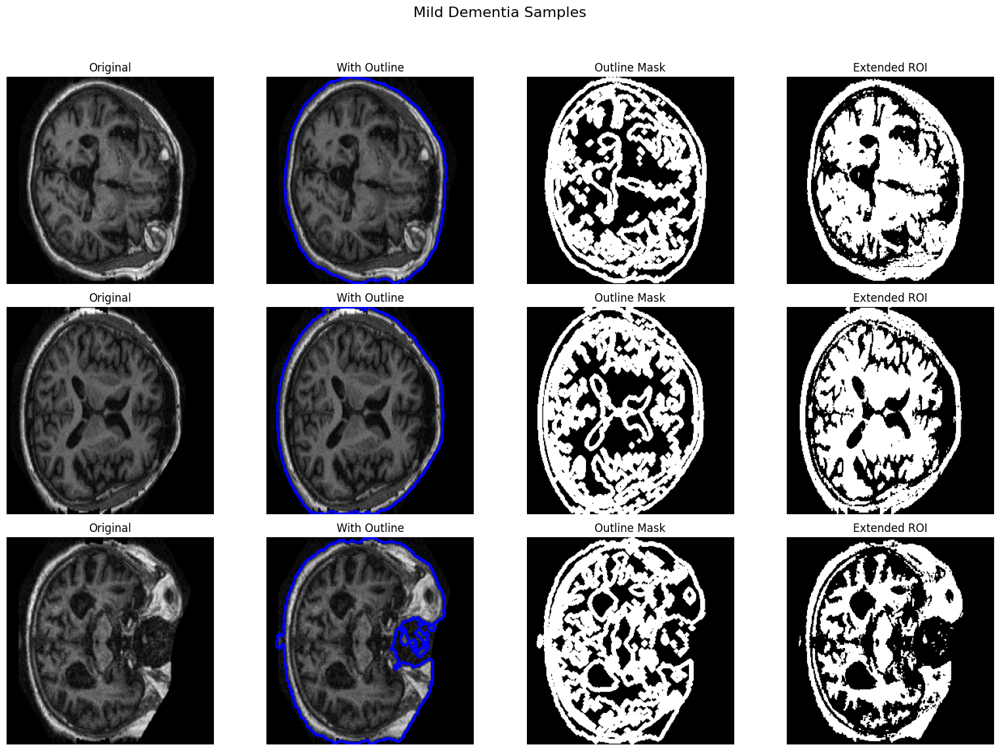

In [ ]:
import os
import glob
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from skimage.measure import label, regionprops

img_size = 256

def get_brain_segmentation(image_np):
    """
    Given a grayscale image (numpy array, range 0-255), use Otsu's method to segment the brain.
    Invert threshold if necessary, so that the brain region is white (255) and the background is black (0).
    """
    image_uint8 = image_np.astype(np.uint8)
    ret, thresh = cv2.threshold(image_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if np.mean(thresh) > 127:
        thresh = cv2.bitwise_not(thresh)
    return thresh

def get_brain_outline(image_np, thickness=3):
    """
    Compute the brain segmentation and then return its outline by subtracting the eroded mask
    from the dilated mask. The result is a binary mask that only contains the outer border (frame)
    of the brain segmentation.
    """
    brain_mask = get_brain_segmentation(image_np)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    dilated = cv2.dilate(brain_mask, kernel, iterations=thickness)
    eroded = cv2.erode(brain_mask, kernel, iterations=thickness)
    outline = cv2.subtract(dilated, eroded)
    outline = np.where(outline > 0, 1, 0).astype(np.uint8)
    return outline, brain_mask

def create_extended_roi(outline_mask, brain_mask, box_size=5):
    """
    Create an extended ROI mask by adding boxes to the inside of the brain outline.

    Args:
        outline_mask (np.array): The binary mask of the brain outline (0 and 1).
        brain_mask (np.array): The binary mask of the whole brain segmentation.
        box_size (int): The size of the square boxes to add.

    Returns:
        np.array: The extended ROI mask.
    """
    extended_roi = np.copy(brain_mask)
    h, w = outline_mask.shape
    for y in range(h):
        for x in range(w):
            if outline_mask[y, x] == 1:
                x1 = max(0, x - box_size)
                x2 = x
                y1 = max(0, y - box_size // 2)
                y2 = min(h, y + box_size // 2 + (box_size % 2))

                for box_y in range(y1, y2):
                  for box_x in range(x1,x2):
                    if brain_mask[box_y, box_x] == 1:
                       extended_roi[box_y, box_x] = 1
    return extended_roi

def process_and_visualize(image_path):
    """
    Load an image, compute its brain outline (frame mask), and the extended ROI and return:
     - The original grayscale image,
     - A color version with the outline overlaid,
     - The outline mask.
     - The extended ROI mask
    """

    img = Image.open(image_path).convert('L').resize((img_size, img_size))
    img_np = np.array(img)


    outline_mask, brain_mask = get_brain_outline(img_np, thickness=3)


    extended_roi_mask = create_extended_roi(outline_mask, brain_mask, box_size=5)


    img_color = cv2.cvtColor(img_np, cv2.COLOR_GRAY2BGR)

    contours, _ = cv2.findContours((outline_mask * 255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img_color, contours, -1, (255, 0, 0), 2)

    return img_np, img_color, outline_mask, extended_roi_mask

def visualize_samples(sample_paths, class_title):
    """
    Visualize 3 random samples from the provided image paths, showing:
      - Original image,
      - Image with the brain outline overlaid,
      - The outline (frame) mask.
      - The extended ROI mask
    """
    sample_paths = random.sample(sample_paths, 3)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.suptitle(class_title, fontsize=16)
    for i, path in enumerate(sample_paths):
        img_np, img_overlay, outline_mask, extended_roi_mask = process_and_visualize(path)
        if img_np is None:
            continue
        axes[i, 0].imshow(img_np, cmap='gray')
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')
        axes[i, 1].imshow(cv2.cvtColor(img_overlay, cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title("With Outline")
        axes[i, 1].axis('off')
        axes[i, 2].imshow(outline_mask, cmap='gray')
        axes[i, 2].set_title("Outline Mask")
        axes[i, 2].axis('off')
        axes[i, 3].imshow(extended_roi_mask, cmap='gray')
        axes[i, 3].set_title("Extended ROI")
        axes[i, 3].axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


dataset_very_mild_paths = glob.glob(os.path.join('/content/source 2/Very mild Dementia', '*.jpg'))
dataset_mild_paths = glob.glob(os.path.join('/content/source 2/Mild Dementia', '*.jpg'))


visualize_samples(dataset_very_mild_paths, "Very Mild Samples")
visualize_samples(dataset_mild_paths, "Mild Dementia Samples")


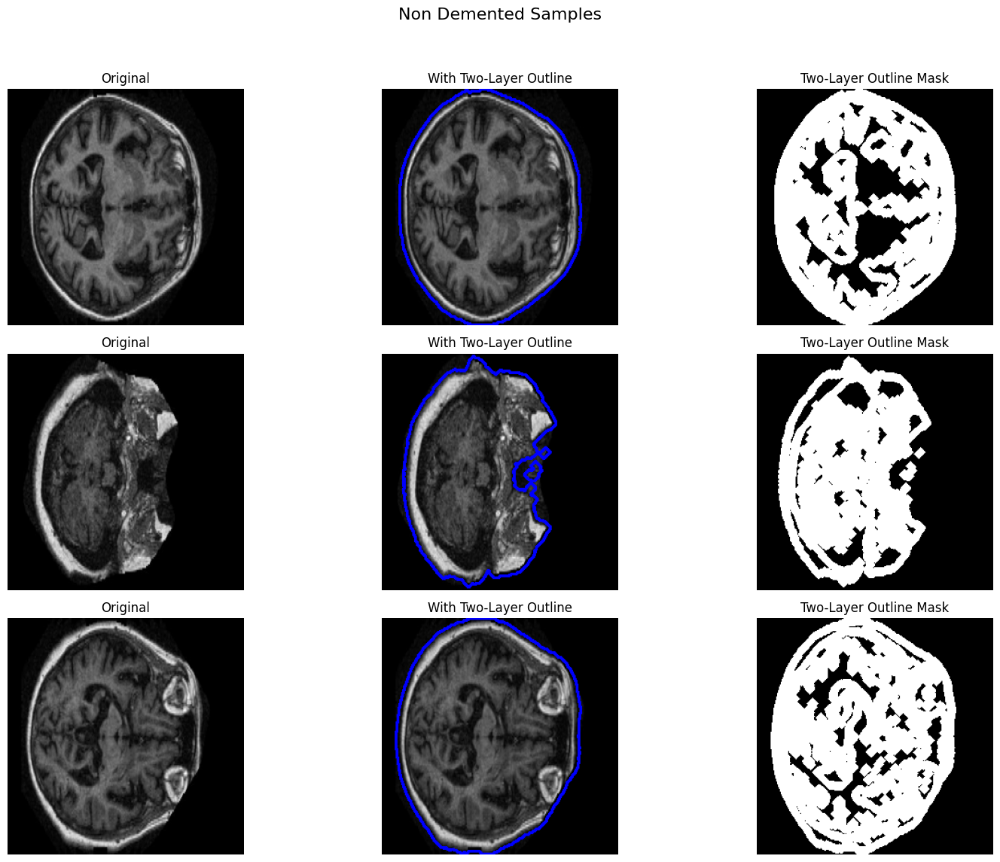

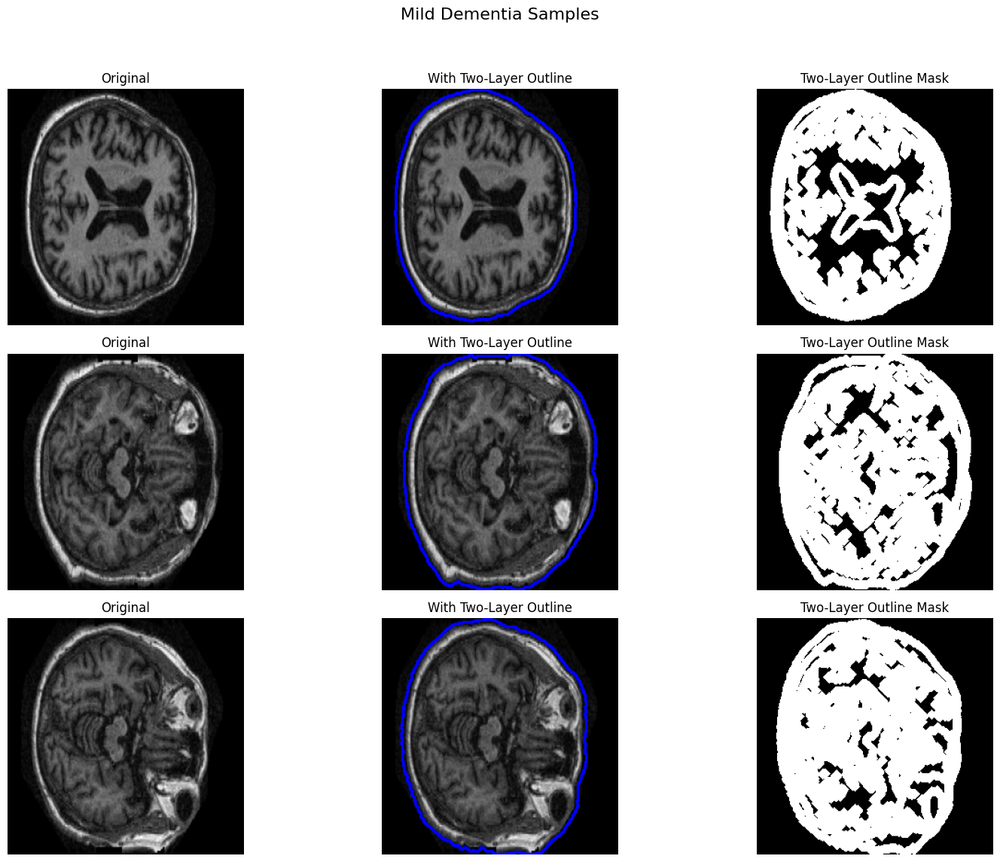

In [ ]:
import os
import glob
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from skimage.measure import label, regionprops

img_size = 256

def get_brain_segmentation(image_np):
    """
    Given a grayscale image (numpy array, range 0-255), use Otsu's method to segment the brain.
    Invert threshold if necessary, so that the brain region is white (255) and the background is black (0).
    """
    image_uint8 = image_np.astype(np.uint8)
    ret, thresh = cv2.threshold(image_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if np.mean(thresh) > 127:
        thresh = cv2.bitwise_not(thresh)
    return thresh

def get_two_layer_brain_outline(image_np):
    """
    Compute two outlines of the brain:
      - outer_outline: computed with 1 iteration (the very outer boundary)
      - inner_outline: computed with 2 iterations, then subtract the outer outline so that only
                       the second closest layer remains.
    The union of these two layers is returned as the two-layer outline mask.
    """
    brain_mask = get_brain_segmentation(image_np)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

    dilated1 = cv2.dilate(brain_mask, kernel, iterations=3)
    eroded1  = cv2.erode(brain_mask, kernel, iterations=3)
    outer_outline = cv2.subtract(dilated1, eroded1)

    dilated2 = cv2.dilate(brain_mask, kernel, iterations=5)
    eroded2  = cv2.erode(brain_mask, kernel, iterations=5)
    thick_outline = cv2.subtract(dilated2, eroded2)

    inner_outline = cv2.subtract(thick_outline, outer_outline)


    two_layer_outline = cv2.bitwise_or(outer_outline, inner_outline)
    two_layer_outline = np.where(two_layer_outline > 0, 1, 0).astype(np.uint8)
    return two_layer_outline, brain_mask

def process_and_visualize(image_path):
    """
    Load an image, compute its two-layer brain outline mask, and return:
      - The original grayscale image,
      - A color version with the two-layer outline overlaid,
      - The two-layer outline mask.
    """
    img = Image.open(image_path).convert('L').resize((img_size, img_size))
    img_np = np.array(img)

    two_layer_outline, brain_mask = get_two_layer_brain_outline(img_np)
    img_color = cv2.cvtColor(img_np, cv2.COLOR_GRAY2BGR)
    contours, _ = cv2.findContours((two_layer_outline * 255).astype(np.uint8),
                                   cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img_color, contours, -1, (255, 0, 0), 2)

    return img_np, img_color, two_layer_outline

def visualize_samples(sample_paths, class_title):
    """
    Visualize 3 random samples from the provided image paths, showing:
      - Original image,
      - Image with the two-layer brain outline overlaid,
      - The two-layer outline mask.
    """
    sample_paths = random.sample(sample_paths, 3)
    fig, axes = plt.subplots(3, 3, figsize=(16, 12))
    fig.suptitle(class_title, fontsize=16)
    for i, path in enumerate(sample_paths):
        img_np, img_overlay, outline_mask = process_and_visualize(path)
        if img_np is None:
            continue
        axes[i, 0].imshow(img_np, cmap='gray')
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')
        axes[i, 1].imshow(cv2.cvtColor(img_overlay, cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title("With Two-Layer Outline")
        axes[i, 1].axis('off')
        axes[i, 2].imshow(outline_mask, cmap='gray')
        axes[i, 2].set_title("Two-Layer Outline Mask")
        axes[i, 2].axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

dataset_very_mild_paths = glob.glob(os.path.join('/content/source 2/Very mild Dementia', '*.jpg'))
dataset_mild_paths = glob.glob(os.path.join('/content/source 2/Mild Dementia', '*.jpg'))

visualize_samples(dataset_very_mild_paths, "Non Demented Samples")
visualize_samples(dataset_mild_paths, "Mild Dementia Samples")


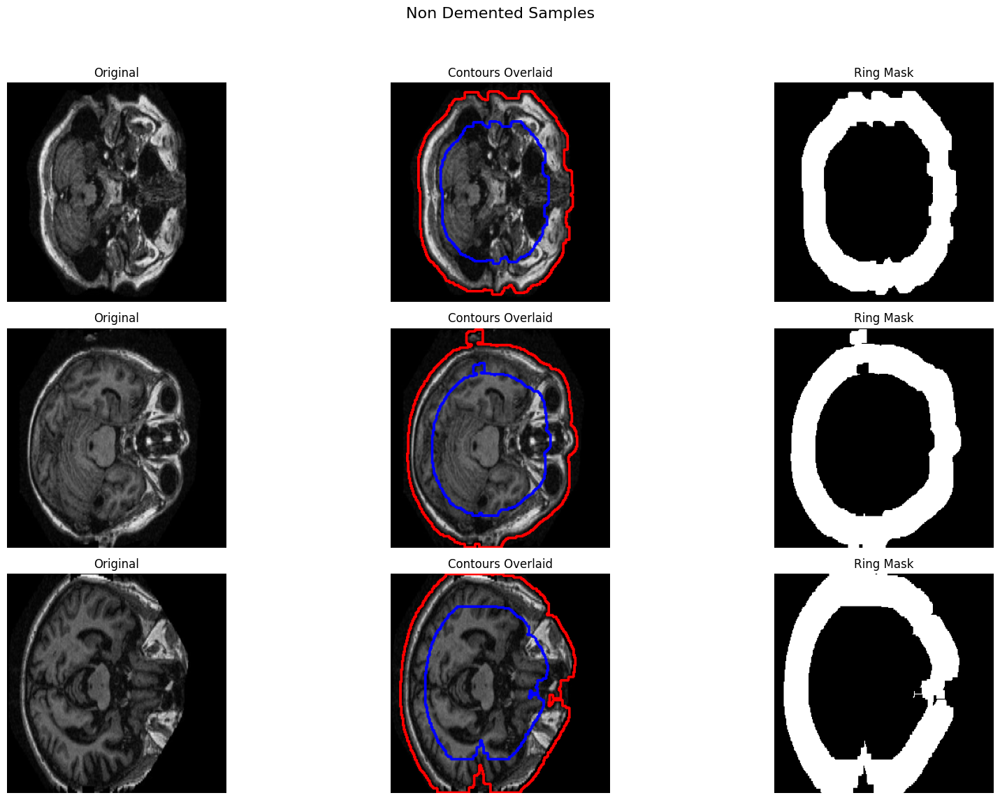

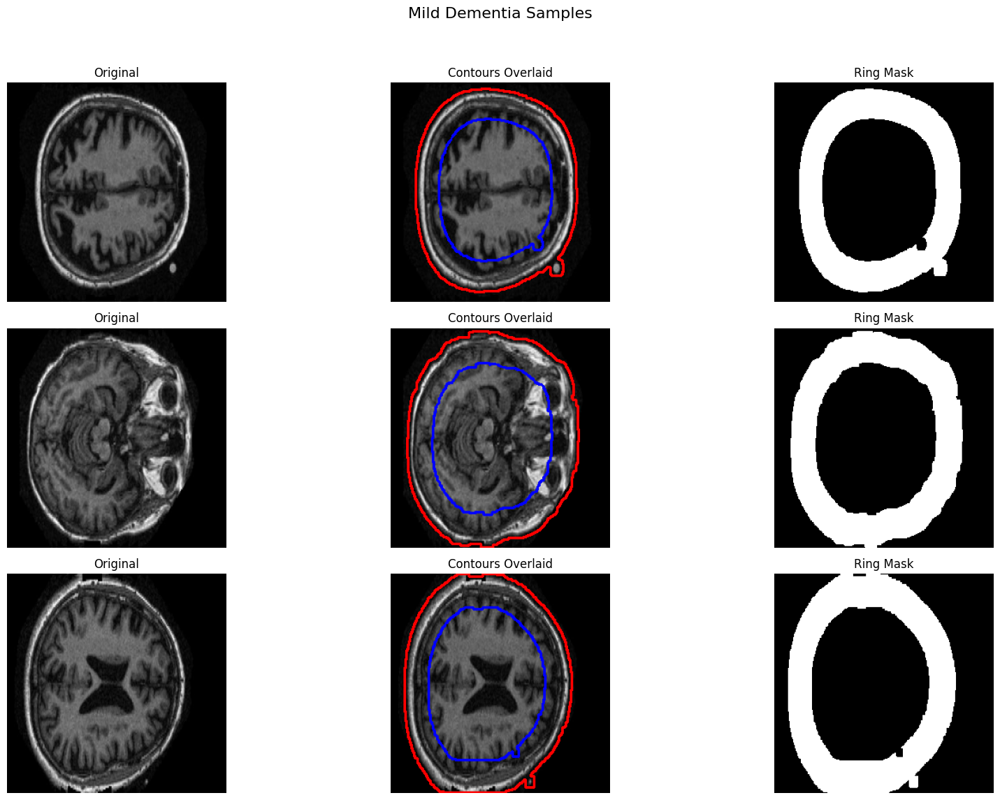

In [ ]:
import os
import glob
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

img_size = 256

def get_brain_segmentation(image_np):
    """
    Given a grayscale image (numpy array, range 0-255), use Otsu's method to segment the brain.
    Invert threshold if necessary so that the brain region is white (255) and the background is black (0).
    """
    image_uint8 = image_np.astype(np.uint8)
    ret, thresh = cv2.threshold(image_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if np.mean(thresh) > 127:
        thresh = cv2.bitwise_not(thresh)
    return thresh

def get_outer_contour(image_np):
    brain_mask = get_brain_segmentation(image_np)

    kernel = np.ones((5, 5), np.uint8)
    brain_mask = cv2.morphologyEx(brain_mask, cv2.MORPH_CLOSE, kernel)
    brain_mask = cv2.dilate(brain_mask, kernel, iterations=2)

    h, w = brain_mask.shape
    mask = np.zeros((h+2, w+2), np.uint8)
    cv2.floodFill(brain_mask, mask, (0,0), 0)
    cv2.floodFill(brain_mask, mask, (w-1,0), 0)
    cv2.floodFill(brain_mask, mask, (0,h-1), 0)
    cv2.floodFill(brain_mask, mask, (w-1,h-1), 0)

    contours, _ = cv2.findContours(brain_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None, brain_mask

    img_h, img_w = image_np.shape[:2]
    max_area = 0
    best_contour = None
    for cnt in contours:
        area = cv2.contourArea(cnt)
        x, y, w_, h_ = cv2.boundingRect(cnt)
        if x <= 5 or y <= 5 or (x + w_) >= (img_w - 5) or (y + h_) >= (img_h - 5):
            if area > max_area:
                max_area = area
                best_contour = cnt

    if best_contour is None:
        best_contour = max(contours, key=cv2.contourArea)

    return best_contour, brain_mask

def scale_contour(contour, scale_factor=0.9):
    """
    Scale a contour inward relative to its centroid.
    For each point in the contour, we compute:
        new_point = centroid + scale_factor * (original_point - centroid)
    """
    M = cv2.moments(contour)
    if M["m00"] == 0:
        return contour
    cx = M["m10"] / M["m00"]
    cy = M["m01"] / M["m00"]

    scaled_contour = []
    for point in contour:
        x, y = point[0]
        new_x = cx + scale_factor * (x - cx)
        new_y = cy + scale_factor * (y - cy)
        scaled_contour.append([[int(new_x), int(new_y)]])
    return np.array(scaled_contour, dtype=np.int32)

def get_ring_mask_from_contours(image_shape, outer_contour, inner_contour):
    """
    Create a binary mask that represents the area between the outer_contour and inner_contour.
    We fill the outer contour and then subtract the inner filled contour.
    """
    outer_mask = np.zeros(image_shape, dtype=np.uint8)
    inner_mask = np.zeros(image_shape, dtype=np.uint8)

    cv2.fillPoly(outer_mask, [outer_contour], 255)
    cv2.fillPoly(inner_mask, [inner_contour], 255)


    ring_mask = cv2.subtract(outer_mask, inner_mask)
    ring_mask = np.where(ring_mask > 0, 1, 0).astype(np.uint8)
    return ring_mask

def process_and_visualize(image_path, scale_factor=0.9):
    """
    Load an image, extract the outer contour and then create an inner contour by scaling.
    Overlay both contours and display the ring (area between them).
    Returns:
      - The original grayscale image,
      - A color image with both contours overlaid,
      - The ring mask.
    """
    img = Image.open(image_path).convert('L').resize((img_size, img_size))
    img_np = np.array(img)

    outer_contour, brain_mask = get_outer_contour(img_np)
    if outer_contour is None:
        print("No contour found!")
        return img_np, None, None

    inner_contour = scale_contour(outer_contour, scale_factor)


    ring_mask = get_ring_mask_from_contours(img_np.shape, outer_contour, inner_contour)


    img_color = cv2.cvtColor(img_np, cv2.COLOR_GRAY2BGR)

    cv2.drawContours(img_color, [outer_contour], -1, (0, 0, 255), 2)
    cv2.drawContours(img_color, [inner_contour], -1, (255, 0, 0), 2)

    return img_np, img_color, ring_mask

def visualize_samples(sample_paths, class_title, scale_factor=0.9):
    """
    Visualize 3 random samples from the provided image paths, showing:
      - The original image,
      - The image with both (outer and scaled inner) contours overlaid,
      - The ring mask (area between the two contours).
    """
    sample_paths = random.sample(sample_paths, 3)
    fig, axes = plt.subplots(3, 3, figsize=(18, 12))
    fig.suptitle(class_title, fontsize=16)

    for i, path in enumerate(sample_paths):
        img_np, img_overlay, ring_mask = process_and_visualize(path, scale_factor=scale_factor)
        if img_np is None or img_overlay is None or ring_mask is None:
            continue

        axes[i, 0].imshow(img_np, cmap='gray')
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(cv2.cvtColor(img_overlay, cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title("Contours Overlaid")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(ring_mask, cmap='gray')
        axes[i, 2].set_title("Ring Mask")
        axes[i, 2].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


dataset_very_mild_paths = glob.glob(os.path.join('/content/source 2/Very mild Dementia', '*.jpg'))
dataset_mild_paths = glob.glob(os.path.join('/content/source 2/Mild Dementia', '*.jpg'))


visualize_samples(dataset_very_mild_paths, "Non Demented Samples", scale_factor=0.7)
visualize_samples(dataset_mild_paths, "Mild Dementia Samples", scale_factor=0.7)


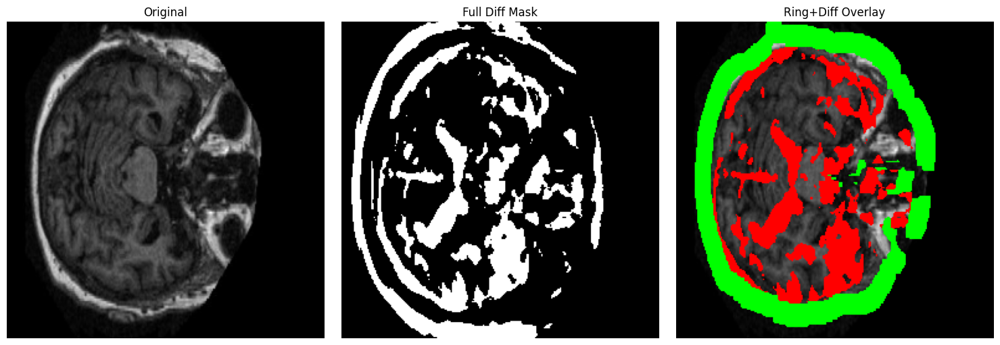

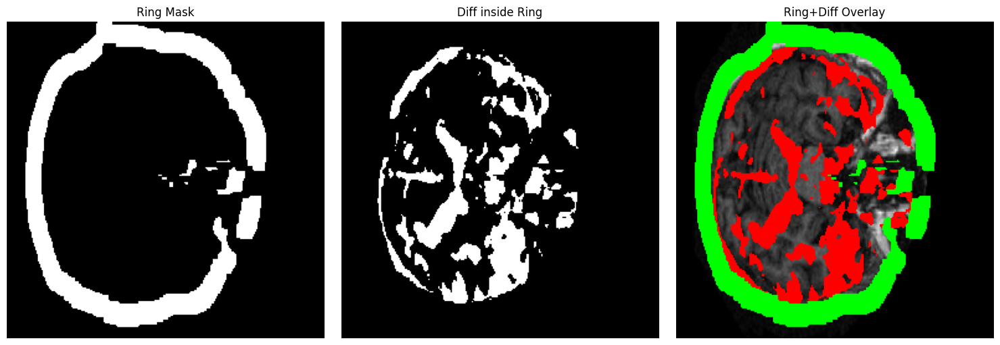

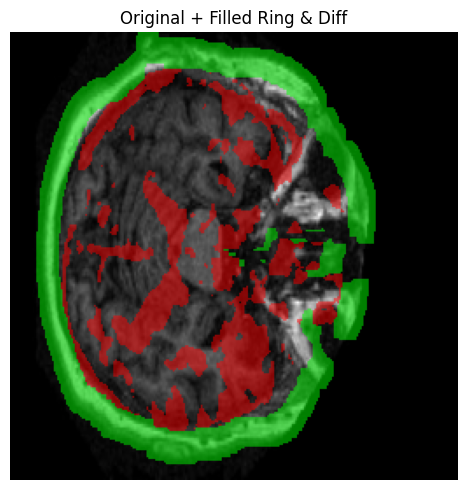

In [ ]:
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt

def crop_diff_to_inner_ring(diff_mask, image, scale_factor=0.85):
    """
    Crops diff_mask to retain only the part inside the inner contour
    derived from the image’s outer contour.

    Returns:
      cropped_diff (np.ndarray) : the diff_mask zeroed outside inner ring
      inner_contour (np.ndarray) : scaled-down contour coordinates
      inner_mask (np.ndarray)    : binary mask of the inner region
    """

    outer_contour, _ = get_outer_contour(image)
    if outer_contour is None:
        return None, None, None


    inner_contour = scale_contour(outer_contour, scale_factor)


    inner_mask = np.zeros_like(diff_mask, dtype=np.uint8)
    cv2.fillPoly(inner_mask, [inner_contour], 1)

    cropped_diff = diff_mask.copy()
    cropped_diff[inner_mask == 0] = 0

    return cropped_diff, inner_contour, inner_mask




sample_path = random.choice(dataset_mild_paths)


img_np, _, ring_mask = process_and_visualize(sample_path, scale_factor=0.85)
if img_np is None or ring_mask is None:
    print("No contour found for this sample.")
else:

    diff_np = diff_vis_very_mild_minus_mild.squeeze().cpu().numpy()
    mask_vm_minus_m = (diff_np > 0.51).astype(np.uint8)


    mask_vm_minus_m, inner_contour, inner_mask = crop_diff_to_inner_ring(
        mask_vm_minus_m, img_np, scale_factor=0.85
    )
    if mask_vm_minus_m is None:
        print("Could not compute inner contour.")
    else:

        overlay1 = cv2.cvtColor(img_np, cv2.COLOR_GRAY2BGR)
        overlay1[ring_mask.astype(bool)]= (0,255,0)
        overlay1[mask_vm_minus_m.astype(bool)] = (0,0,255)
        overlap = (ring_mask & mask_vm_minus_m).astype(bool)
        overlay1[overlap] =(0,255,255)

        plt.figure(figsize=(15,5))
        plt.subplot(1,3,1)
        plt.imshow(img_np, cmap='gray');      plt.title("Original");
        plt.axis('off')
        plt.subplot(1,3,2)
        plt.imshow((diff_np>0.51).astype(np.uint8), cmap='gray');
        plt.title("Full Diff Mask"); plt.axis('off')
        plt.subplot(1,3,3)
        plt.imshow(cv2.cvtColor(overlay1, cv2.COLOR_BGR2RGB))
        plt.title("Ring+Diff Overlay"); plt.axis('off')
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(15,5))
        plt.subplot(1,3,1)
        plt.imshow(ring_mask, cmap='gray');
        plt.title("Ring Mask");        plt.axis('off')
        plt.subplot(1,3,2)
        plt.imshow(mask_vm_minus_m, cmap='gray');
        plt.title("Diff inside Ring"); plt.axis('off')
        plt.subplot(1,3,3)
        plt.imshow(cv2.cvtColor(overlay1, cv2.COLOR_BGR2RGB))
        plt.title("Ring+Diff Overlay"); plt.axis('off')
        plt.tight_layout()
        plt.show()

        final_overlay = cv2.cvtColor(img_np, cv2.COLOR_GRAY2BGR)
        alpha = 0.5
        red_layer   = np.zeros_like(final_overlay); red_layer[...,2] = 255
        green_layer = np.zeros_like(final_overlay); green_layer[...,1] = 255

        ring_only  = (ring_mask == 1) & (mask_vm_minus_m == 0)
        diff_inside = (mask_vm_minus_m == 1)

        final_overlay[ring_only] = (
            final_overlay[ring_only] * (1-alpha) +
            green_layer[ring_only]   * alpha
        ).astype(np.uint8)

        final_overlay[diff_inside] = (
            final_overlay[diff_inside] * (1-alpha) +
            red_layer[diff_inside]     * alpha
        ).astype(np.uint8)


        plt.figure(figsize=(5,5))
        plt.imshow(cv2.cvtColor(final_overlay, cv2.COLOR_BGR2RGB))
        plt.title("Original + Filled Ring & Diff"); plt.axis('off')
        plt.tight_layout()
        plt.show()


Original Very Mild dataset length: 13725
Original Mild dataset length: 5002
Balanced Very Mild dataset length: 13725
Balanced Mild dataset length: 13725
Visualizing Balanced Non Demented samples:


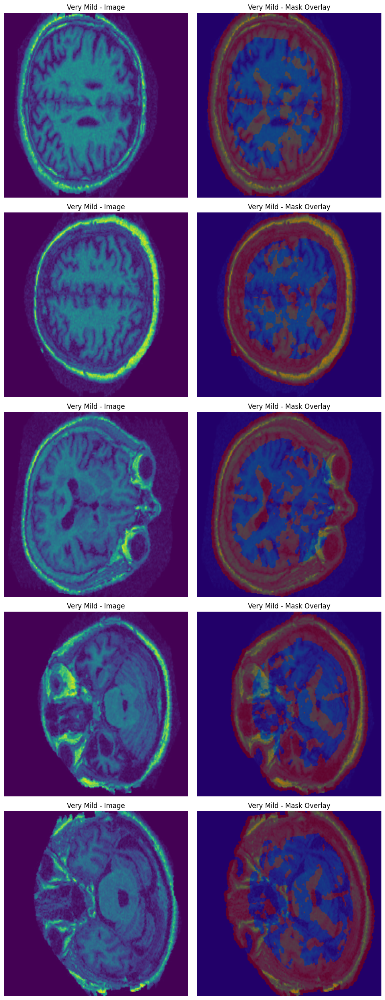

Visualizing Balanced Mild samples:


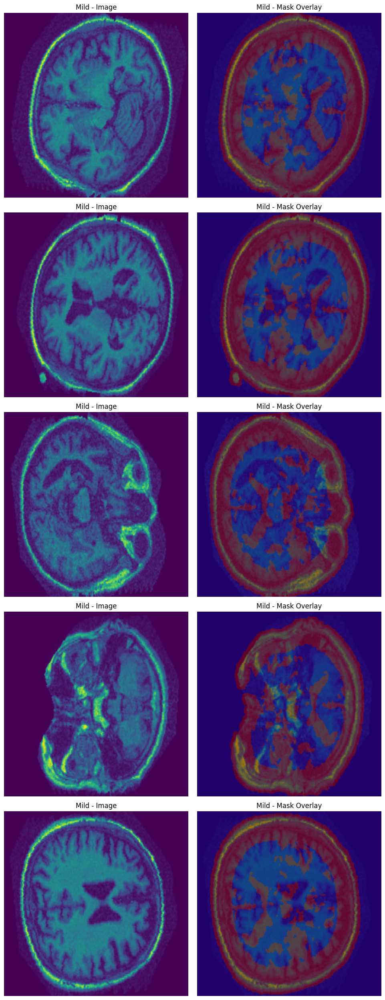

In [ ]:
import os
import glob
import random
import numpy as np
import cv2
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt


img_size = 256

def get_brain_segmentation(image_np):
    image_uint8 = image_np.astype(np.uint8)
    ret, thresh = cv2.threshold(image_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if np.mean(thresh) > 127:
        thresh = cv2.bitwise_not(thresh)
    return thresh

def get_outer_contour(image_np):
    brain_mask = get_brain_segmentation(image_np)
    kernel = np.ones((5, 5), np.uint8)
    brain_mask = cv2.morphologyEx(brain_mask, cv2.MORPH_CLOSE, kernel)
    brain_mask = cv2.dilate(brain_mask, kernel, iterations=2)
    h, w = brain_mask.shape
    mask = np.zeros((h+2, w+2), np.uint8)
    cv2.floodFill(brain_mask, mask, (0, 0), 0)
    cv2.floodFill(brain_mask, mask, (w-1, 0), 0)
    cv2.floodFill(brain_mask, mask, (0, h-1), 0)
    cv2.floodFill(brain_mask, mask, (w-1, h-1), 0)
    contours, _ = cv2.findContours(brain_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None, brain_mask
    img_h, img_w = image_np.shape[:2]
    max_area = 0
    best_contour = None
    for cnt in contours:
        area = cv2.contourArea(cnt)
        x, y, w_, h_ = cv2.boundingRect(cnt)
        if x <= 5 or y <= 5 or (x + w_) >= (img_w - 5) or (y + h_) >= (img_h - 5):
            if area > max_area:
                max_area = area
                best_contour = cnt
    if best_contour is None:
        best_contour = max(contours, key=cv2.contourArea)
    return best_contour, brain_mask

def scale_contour(contour, scale_factor=0.9):
    M = cv2.moments(contour)
    if M["m00"] == 0:
        return contour
    cx = M["m10"] / M["m00"]
    cy = M["m01"] / M["m00"]
    scaled_contour = []
    for point in contour:
        x, y = point[0]
        new_x = cx + scale_factor * (x - cx)
        new_y = cy + scale_factor * (y - cy)
        scaled_contour.append([[int(new_x), int(new_y)]])
    return np.array(scaled_contour, dtype=np.int32)

def get_ring_mask_from_contours(image_shape, outer_contour, inner_contour):
    outer_mask = np.zeros(image_shape, dtype=np.uint8)
    inner_mask = np.zeros(image_shape, dtype=np.uint8)
    cv2.fillPoly(outer_mask, [outer_contour], 255)
    cv2.fillPoly(inner_mask, [inner_contour], 255)
    ring_mask = cv2.subtract(outer_mask, inner_mask)
    ring_mask = np.where(ring_mask > 0, 1, 0).astype(np.uint8)
    return ring_mask


def paired_transform(img, mask, transform_img, transform_mask):
    """
    Applies the same random seed to both image and mask transformations
    so that augmentations (flips, rotations, etc.) are applied consistently.
    """
    seed = np.random.randint(2147483647)
    random.seed(seed)
    torch.manual_seed(seed)
    img_transformed = transform_img(img)
    random.seed(seed)
    torch.manual_seed(seed)
    mask_transformed = transform_mask(mask)
    mask_transformed = (mask_transformed > 0.5).float()
    return img_transformed, mask_transformed


transform_img = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


transform_mask = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])


class BrainDataset(Dataset):
    """
    Loads brain images, computes the binary ring mask (outer brain layer),
    and returns both the original image and a combined ROI+diff mask.

    If a global diff mask is provided, it is cropped per-image to the inner contour
    and combined (union) with the ring mask.
    """
    def __init__(
        self,
        image_paths,
        scale_factor=0.9,
        transform_img=None,
        transform_mask=None,
        diff_mask=None,
        precompute_masks=False,
        img_size=256
    ):
        self.image_paths = image_paths
        self.scale_factor = scale_factor
        self.transform_img = transform_img
        self.transform_mask = transform_mask
        self.diff_mask = diff_mask
        self.precompute_masks = precompute_masks
        self.img_size = img_size

        if self.precompute_masks:
            self.precomputed = []
            for path in self.image_paths:
                img = Image.open(path).convert('L').resize((img_size, img_size))
                img_np = np.array(img)

                outer_ct, _ = get_outer_contour(img_np)
                if outer_ct is not None:
                    inner_ct = scale_contour(outer_ct, self.scale_factor)
                    ring_mask = get_ring_mask_from_contours(img_np.shape, outer_ct, inner_ct)
                else:
                    ring_mask = np.zeros(img_np.shape, dtype=np.uint8)

                if self.diff_mask is not None:
                    raw_diff = (self.diff_mask > 0).astype(np.uint8)
                    diff_cropped = crop_diff_to_inner_ring(raw_diff, img_np, self.scale_factor)[0]
                else:
                    diff_cropped = np.zeros_like(ring_mask)

                combined = ((ring_mask == 1) | (diff_cropped == 1)).astype(np.uint8)
                mask_img = Image.fromarray((combined * 255).astype(np.uint8))
                self.precomputed.append((img, mask_img))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):

        if self.precompute_masks:
            img, mask = self.precomputed[idx]
        else:
            path = self.image_paths[idx]
            img = Image.open(path).convert('L').resize((self.img_size, self.img_size))
            img_np = np.array(img)


            outer_ct, _ = get_outer_contour(img_np)
            if outer_ct is not None:
                inner_ct = scale_contour(outer_ct, self.scale_factor)
                ring_mask = get_ring_mask_from_contours(img_np.shape, outer_ct, inner_ct)
            else:
                ring_mask = np.zeros(img_np.shape, dtype=np.uint8)


            if self.diff_mask is not None:
                raw_diff = (self.diff_mask > 0).astype(np.uint8)
                diff_cropped = crop_diff_to_inner_ring(raw_diff, img_np, self.scale_factor)[0]
            else:
                diff_cropped = np.zeros_like(ring_mask)

            combined = ((ring_mask == 1) | (diff_cropped == 1)).astype(np.uint8)
            mask = Image.fromarray((combined * 255).astype(np.uint8))


        if self.transform_img and self.transform_mask:
            img_trans, mask_trans = paired_transform(img, mask, self.transform_img, self.transform_mask)
        else:
            img_trans = transforms.ToTensor()(img)
            mask_trans = transforms.ToTensor()(mask)
            mask_trans = (mask_trans > 0.5).float()

        return img_trans, mask_trans


class OversampledDataset(Dataset):
    def __init__(self, dataset, target_length):
        self.dataset = dataset
        self.target_length = target_length
    def __len__(self):
        return self.target_length
    def __getitem__(self, idx):
        rand_idx = random.randint(0, len(self.dataset) - 1)
        return self.dataset[rand_idx]

dataset_very_mild_paths = glob.glob(os.path.join('/content/source 2/Very mild Dementia', '*.jpg'))
dataset_mild_paths = glob.glob(os.path.join('/content/source 2/Mild Dementia', '*.jpg'))

very_mild_dataset = BrainDataset(dataset_very_mild_paths, scale_factor=0.7,
                                 transform_img=transform_img, transform_mask=transform_mask,
                                 precompute_masks=False,diff_mask = mask_vm_minus_m)
mild_dataset = BrainDataset(dataset_mild_paths, scale_factor=0.7,
                            transform_img=transform_img, transform_mask=transform_mask,
                            precompute_masks=False,diff_mask = mask_vm_minus_m)

print("Original Very Mild dataset length:", len(very_mild_dataset))
print("Original Mild dataset length:", len(mild_dataset))

if len(very_mild_dataset) < len(mild_dataset):
    balanced_very_mild = OversampledDataset(very_mild_dataset, target_length=len(mild_dataset))
    balanced_mild = mild_dataset
else:
    balanced_mild = OversampledDataset(mild_dataset, target_length=len(very_mild_dataset))
    balanced_very_mild = very_mild_dataset

print("Balanced Very Mild dataset length:", len(balanced_very_mild))
print("Balanced Mild dataset length:", len(balanced_mild))

loader_very_mild = DataLoader(balanced_very_mild, batch_size=16, shuffle=True, num_workers=4)
loader_mild = DataLoader(balanced_mild, batch_size=16, shuffle=True, num_workers=4)


def visualize_samples(dataset, title, num_samples=5):
    indices = random.sample(range(len(dataset)), num_samples)
    plt.figure(figsize=(10, 5*num_samples))
    for i, idx in enumerate(indices):
        img_tensor, mask_tensor = dataset[idx]
        img_np = img_tensor.squeeze().detach().cpu().numpy()
        mask_np = mask_tensor.squeeze().detach().cpu().numpy()
        plt.subplot(num_samples, 2, i*2+1)
        plt.imshow(img_np)
        plt.title(f"{title} - Image")
        plt.axis('off')
        plt.subplot(num_samples, 2, i*2+2)
        plt.imshow(img_np)
        plt.imshow(mask_np, cmap='jet', alpha=0.5)
        plt.title(f"{title} - Mask Overlay")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

print("Visualizing Balanced Non Demented samples:")
visualize_samples(balanced_very_mild, "Very Mild")
print("Visualizing Balanced Mild samples:")
visualize_samples(balanced_mild, "Mild")




AttributeError: partially initialized module 'torch._dynamo' has no attribute 'config' (most likely due to a circular import)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import os
drive_checkpoint_dir = '/content/drive/MyDrive/cyclegan_checkpoints'
os.makedirs(drive_checkpoint_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class ResnetBlock(nn.Module):
    def __init__(self, dim, use_dropout=False):
        super(ResnetBlock, self).__init__()
        layers = [
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True)
        ]
        if use_dropout:
            layers.append(nn.Dropout(0.5))
        layers += [
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim)
        ]
        self.conv_block = nn.Sequential(*layers)

    def forward(self, x):
        return x + self.conv_block(x)


class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, n_blocks=6):
        """
        input_nc: number of input channels (2 here: image + mask)
        output_nc: number of output channels (1 for grayscale)
        n_blocks: number of ResNet blocks
        """
        assert(n_blocks >= 0)
        super(Generator, self).__init__()
        model = []
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, 64, kernel_size=7, padding=0),
            nn.InstanceNorm2d(64),
            nn.ReLU(True)
        ]
        n_downsampling = 2
        in_features = 64
        for i in range(n_downsampling):
            out_features = in_features * 2
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features

        for i in range(n_blocks):
            model += [ResnetBlock(in_features, use_dropout=True)]

        for i in range(n_downsampling):
            out_features = in_features // 2
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, output_nc, kernel_size=7, padding=0),
            nn.Tanh()
        ]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, input_nc):
        """
        input_nc: number of input channels (1 for grayscale images)
        """
        super(Discriminator, self).__init__()
        model = [
            nn.Conv2d(input_nc, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, True)
        ]
        model += [
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, True)
        ]
        model += [
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, True)
        ]
        model += [
            nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, True)
        ]
        model += [nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


G_AtoB = Generator(input_nc=2, output_nc=1, n_blocks=6).to(device)
G_BtoA = Generator(input_nc=2, output_nc=1, n_blocks=6).to(device)
D_A = Discriminator(input_nc=1).to(device)
D_B = Discriminator(input_nc=1).to(device)

criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()

lr = 0.0002
beta1 = 0.5
optimizer_G = optim.Adam(list(G_AtoB.parameters()) + list(G_BtoA.parameters()), lr=lr, betas=(beta1, 0.999))
optimizer_D_A = optim.Adam(D_A.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_D_B = optim.Adam(D_B.parameters(), lr=lr, betas=(beta1, 0.999))


lr_lambda = lambda epoch: 1.0 - max(0, epoch - 20) / 100.0
scheduler_G = torch.optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lr_lambda)
scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(optimizer_D_A, lr_lambda=lr_lambda)
scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(optimizer_D_B, lr_lambda=lr_lambda)


num_epochs = 200


for epoch in range(num_epochs):

    iter_A = iter(loader_very_mild)
    iter_B = iter(loader_mild)
    num_batches = min(len(loader_very_mild), len(loader_mild))

    for i in range(num_batches):
        real_A, mask_A = next(iter_A)
        real_B, mask_B = next(iter_B)

        real_A = real_A.to(device)
        mask_A = mask_A.to(device)
        real_B = real_B.to(device)
        mask_B = mask_B.to(device)


        input_A = torch.cat((real_A, mask_A), dim=1)
        input_B = torch.cat((real_B, mask_B), dim=1)


        valid = torch.ones((real_A.size(0), 1, 30, 30), device=device, requires_grad=False)
        fake = torch.zeros((real_A.size(0), 1, 30, 30), device=device, requires_grad=False)


        optimizer_G.zero_grad()


        identity_A = G_BtoA(torch.cat((real_A, mask_A), dim=1))
        loss_identity_A = criterion_identity(identity_A, real_A)
        identity_B = G_AtoB(torch.cat((real_B, mask_B), dim=1))
        loss_identity_B = criterion_identity(identity_B, real_B)


        fake_B = G_AtoB(input_A)
        pred_fake_B = D_B(fake_B)
        loss_GAN_AtoB = criterion_GAN(pred_fake_B, valid)

        fake_A = G_BtoA(input_B)
        pred_fake_A = D_A(fake_A)
        loss_GAN_BtoA = criterion_GAN(pred_fake_A, valid)

        recov_A = G_BtoA(torch.cat((fake_B, mask_A), dim=1))
        loss_cycle_A = criterion_cycle(recov_A, real_A)
        recov_B = G_AtoB(torch.cat((fake_A, mask_B), dim=1))
        loss_cycle_B = criterion_cycle(recov_B, real_B)
        loss_cycle = (loss_cycle_A + loss_cycle_B) * 10.0


        loss_G = loss_identity_A + loss_identity_B + loss_GAN_AtoB + loss_GAN_BtoA + loss_cycle
        loss_G.backward()

        torch.nn.utils.clip_grad_norm_(list(G_AtoB.parameters()) + list(G_BtoA.parameters()), max_norm=5.0)
        optimizer_G.step()
        optimizer_D_A.zero_grad()

        pred_real_A = D_A(real_A)
        loss_D_real_A = criterion_GAN(pred_real_A, valid)

        pred_fake_A = D_A(fake_A.detach())
        loss_D_fake_A = criterion_GAN(pred_fake_A, fake)
        loss_D_A = 0.5 * (loss_D_real_A + loss_D_fake_A)
        loss_D_A.backward()
        torch.nn.utils.clip_grad_norm_(D_A.parameters(), max_norm=5.0)
        optimizer_D_A.step()


        optimizer_D_B.zero_grad()

        pred_real_B = D_B(real_B)
        loss_D_real_B = criterion_GAN(pred_real_B, valid)

        pred_fake_B = D_B(fake_B.detach())
        loss_D_fake_B = criterion_GAN(pred_fake_B, fake)
        loss_D_B = 0.5 * (loss_D_real_B + loss_D_fake_B)
        loss_D_B.backward()
        torch.nn.utils.clip_grad_norm_(D_B.parameters(), max_norm=5.0)
        optimizer_D_B.step()

        if i % 100 == 0:
            print(f"Epoch [{epoch}/{num_epochs}] Batch [{i}/{num_batches}] "
                  f"Loss_G: {loss_G.item():.4f} Loss_D_A: {loss_D_A.item():.4f} Loss_D_B: {loss_D_B.item():.4f}")

            real_image_A = (real_A[0].detach().cpu().numpy() + 1) / 2.0
            generated_fake_B = (fake_B[0].detach().cpu().numpy() + 1) / 2.0
            real_image_B = (real_B[0].detach().cpu().numpy() + 1) / 2.0

            real_image_A = real_image_A.squeeze()
            generated_fake_B = generated_fake_B.squeeze()
            real_image_B = real_image_B.squeeze()

            diff_mask = abs(real_image_A - generated_fake_B)
            diff_mask = (diff_mask - diff_mask.min()) / (diff_mask.max() - diff_mask.min() + 1e-8)


            fig, axes = plt.subplots(1, 4, figsize=(16, 4))

            axes[0].imshow(real_image_A, cmap='gray')
            axes[0].set_title("Input: Real Domain A")
            axes[0].axis("off")

            axes[1].imshow(generated_fake_B, cmap='gray')
            axes[1].set_title("Output: Generated Fake Domain B")
            axes[1].axis("off")

            axes[2].imshow(real_image_B, cmap='gray')
            axes[2].set_title("Target: Real Domain B")
            axes[2].axis("off")
            axes[3].imshow(generated_fake_B, cmap='gray')
            axes[3].imshow(diff_mask, cmap='jet', alpha=0.5)
            axes[3].set_title("Diff Overlay (Input vs Output)")
            axes[3].axis("off")

            plt.tight_layout()
            plt.savefig(f"2ndtraining_output_composite_epoch_{epoch}_batch_{i}.png")
            plt.close(fig)


    scheduler_G.step()
    scheduler_D_A.step()
    scheduler_D_B.step()
    G_AtoB_path = os.path.join(drive_checkpoint_dir, f'2ndG_AtoB_epoch_{epoch}.pth')
    G_BtoA_path = os.path.join(drive_checkpoint_dir, f'2ndG_BtoA_epoch_{epoch}.pth')
    torch.save(G_AtoB.state_dict(), G_AtoB_path)
    torch.save(G_BtoA.state_dict(), G_BtoA_path)

    if epoch % 10 == 0:
        D_A_path = os.path.join(drive_checkpoint_dir, f'2ndD_A_epoch_{epoch}.pth')
        D_B_path = os.path.join(drive_checkpoint_dir, f'2ndD_B_epoch_{epoch}.pth')
        torch.save(D_A.state_dict(), D_A_path)
        torch.save(D_B.state_dict(), D_B_path)


KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import os
drive_checkpoint_dir = '/content/drive/MyDrive/cyclegan_checkpoints'
os.makedirs(drive_checkpoint_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class ResnetBlock(nn.Module):
    def __init__(self, dim, use_dropout=False):
        super(ResnetBlock, self).__init__()
        layers = [
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True)
        ]
        if use_dropout:
            layers.append(nn.Dropout(0.5))
        layers += [
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim)
        ]
        self.conv_block = nn.Sequential(*layers)

    def forward(self, x):
        return x + self.conv_block(x)


class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, n_blocks=6):
        """
        input_nc: number of input channels (2 here: image + mask)
        output_nc: number of output channels (1 for grayscale)
        n_blocks: number of ResNet blocks
        """
        assert(n_blocks >= 0)
        super(Generator, self).__init__()
        model = []

        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, 64, kernel_size=7, padding=0),
            nn.InstanceNorm2d(64),
            nn.ReLU(True)
        ]

        n_downsampling = 2
        in_features = 64
        for i in range(n_downsampling):
            out_features = in_features * 2
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features

        for i in range(n_blocks):
            model += [ResnetBlock(in_features, use_dropout=True)]

        for i in range(n_downsampling):
            out_features = in_features // 2
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features

        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, output_nc, kernel_size=7, padding=0),
            nn.Tanh()
        ]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, input_nc):
        """
        input_nc: number of input channels (1 for grayscale images)
        """
        super(Discriminator, self).__init__()
        model = [
            nn.Conv2d(input_nc, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, True)
        ]
        model += [
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, True)
        ]
        model += [
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, True)
        ]
        model += [
            nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, True)
        ]
        model += [nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


G_AtoB = Generator(input_nc=2, output_nc=1, n_blocks=6).to(device)
G_BtoA = Generator(input_nc=2, output_nc=1, n_blocks=6).to(device)
D_A = Discriminator(input_nc=1).to(device)
D_B = Discriminator(input_nc=1).to(device)

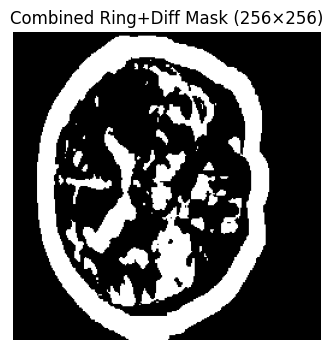

Saved composite → results/composite_out.png


In [ ]:
import os
import cv2
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

def get_brain_segmentation(image_np):
    _, thresh = cv2.threshold(image_np.astype(np.uint8), 0, 255,
                              cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if np.mean(thresh) > 127:
        thresh = cv2.bitwise_not(thresh)
    return thresh

def get_outer_contour(image_np):
    brain_mask = get_brain_segmentation(image_np)
    kernel = np.ones((5,5), np.uint8)
    brain_mask = cv2.morphologyEx(brain_mask, cv2.MORPH_CLOSE, kernel)
    brain_mask = cv2.dilate(brain_mask, kernel, iterations=2)
    h, w = brain_mask.shape
    flood = np.zeros((h+2, w+2), np.uint8)
    for pt in [(0,0),(w-1,0),(0,h-1),(w-1,h-1)]:
        cv2.floodFill(brain_mask, flood, pt, 0)
    cnts, _ = cv2.findContours(brain_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return None, brain_mask
    img_h, img_w = image_np.shape
    best, area = None, 0
    for c in cnts:
        x,y,ww,hh = cv2.boundingRect(c)
        a = cv2.contourArea(c)
        if ((x<=5 or y<=5 or x+ww>=img_w-5 or y+hh>=img_h-5) and a>area):
            best, area = c, a
    return (best if best is not None else max(cnts, key=cv2.contourArea)), brain_mask

def scale_contour(contour, scale_factor=0.9):
    M = cv2.moments(contour)
    if M["m00"] == 0: return contour
    cx, cy = M["m10"]/M["m00"], M["m01"]/M["m00"]
    scaled = [[[int(cx + scale_factor*(pt[0][0]-cx)),
                int(cy + scale_factor*(pt[0][1]-cy))]] for pt in contour]
    return np.array(scaled, np.int32)

def get_ring_mask_from_contours(shape, outer_ct, inner_ct):
    om = np.zeros(shape, np.uint8)
    im = np.zeros(shape, np.uint8)
    cv2.fillPoly(om, [outer_ct], 255)
    cv2.fillPoly(im, [inner_ct], 255)
    ring = cv2.subtract(om, im)
    return (ring>0).astype(np.uint8)

def crop_diff_to_inner_ring(raw_diff, image_np, scale_factor):
    outer_ct, _ = get_outer_contour(image_np)
    if outer_ct is None:
        return raw_diff*0, np.zeros_like(raw_diff)
    inner_ct = scale_contour(outer_ct, scale_factor)
    inner_mask = np.zeros_like(raw_diff, dtype=np.uint8)
    cv2.fillPoly(inner_mask, [inner_ct], 1)
    return raw_diff * inner_mask, inner_mask


def infer_single_composite(
    image_path: str,
    generator: torch.nn.Module,
    device: torch.device,
    scale_factor: float    = 0.7,
    input_size: int        = img_size,
    diff_mask: np.ndarray  = None,
    output_path: str       = "composite.png",
    mask_output_path: str  = "mask.png"
):

    orig_pil   = Image.open(image_path).convert("L")
    orig_full  = np.array(orig_pil, dtype=np.uint8)
    H_full, W_full = orig_full.shape


    small_pil  = orig_pil.resize((input_size, input_size), Image.BILINEAR)
    img_small  = np.array(small_pil, dtype=np.uint8)


    outer_ct, _ = get_outer_contour(img_small)
    if outer_ct is not None:
        inner_ct   = scale_contour(outer_ct, scale_factor)
        ring_small = get_ring_mask_from_contours(img_small.shape, outer_ct, inner_ct)
    else:
        ring_small = np.zeros_like(img_small, np.uint8)

    if diff_mask is not None:
        diff_small = cv2.resize((diff_mask>0).astype(np.uint8),
                                (input_size, input_size),
                                interpolation=cv2.INTER_NEAREST)
        diff_crop, _ = crop_diff_to_inner_ring(diff_small, img_small, scale_factor)
    else:
        diff_crop = np.zeros_like(ring_small)
    combined_small = np.logical_or(ring_small, diff_crop).astype(np.uint8)

    mask_vis = (combined_small * 255).astype(np.uint8)
    plt.figure(figsize=(4,4))
    plt.imshow(mask_vis, cmap="gray", vmin=0, vmax=255)
    plt.title("Combined Ring+Diff Mask (256×256)")
    plt.axis("off")
    plt.show()

    t_img  = transforms.ToTensor()(img_small)
    t_img  = (t_img - 0.5)/0.5
    t_mask = transforms.ToTensor()(combined_small>0)
    inp    = torch.cat([t_img, t_mask], dim=0).unsqueeze(0).to(device)

    generator.eval()
    with torch.no_grad():
        out_small = generator(inp)[0,0].cpu().numpy()
    out_small = (out_small + 1.0)/2.0    # [0,1]
    gen_small = (out_small*255).astype(np.uint8)

    gen_full = cv2.resize(gen_small, (W_full, H_full),
                          interpolation=cv2.INTER_LINEAR)

    diff_full = np.abs(orig_full.astype(np.float32)/255.0 -
                       gen_full.astype(np.float32)/255.0)

    fig, axs = plt.subplots(1,3, figsize=(15,5))
    axs[0].imshow(orig_full, cmap="gray"); axs[0].set_title("Original");  axs[0].axis("off")
    axs[1].imshow(gen_full,  cmap="gray"); axs[1].set_title("Generated"); axs[1].axis("off")
    im = axs[2].imshow(diff_full, cmap="jet", vmin=0, vmax=diff_full.max())
    axs[2].set_title("Difference"); axs[2].axis("off")
    cbar = fig.colorbar(im, ax=axs[2], fraction=0.046, pad=0.04)
    cbar.set_label("Absolute change")
    plt.tight_layout()

    os.makedirs(os.path.dirname(output_path) or ".", exist_ok=True)
    fig.savefig(output_path, dpi=150)
    plt.close(fig)
    print(f"Saved composite → {output_path}")


ckpt = os.path.join("/content/drive/MyDrive/cyclegan_checkpoints", "G_AtoB_epoch_15.pth")
G_AtoB.load_state_dict(torch.load(ckpt, map_location=device))

infer_single_composite(
    "/content/source 2/Very mild Dementia/OAS1_0003_MR1_mpr-1_138.jpg",
    G_AtoB,
    device,
    scale_factor=0.85,
    input_size=img_size,
    diff_mask=mask_vm_minus_m,
    output_path="results/composite_out.png",
    mask_output_path="results/mask_out.png"
)


In [ ]:
import os
import glob
import random

source_dir = "/content/source 2/Very mild Dementia"
output_base = "results/very_mild_to_mild_ROI"
n_samples   = 20

os.makedirs(output_base, exist_ok=True)

all_paths = glob.glob(os.path.join(source_dir, "*.jpg"))
if len(all_paths) < n_samples:
    raise ValueError(f"Only found {len(all_paths)} images, but asked for {n_samples}")

random_paths = random.sample(all_paths, n_samples)

for img_path in random_paths:
    name = os.path.splitext(os.path.basename(img_path))[0]

    composite_path = os.path.join(output_base, f"{name}_composite.png")
    mask_path      = os.path.join(output_base, f"{name}_mask.png")

    infer_single_composite(
        image_path        = img_path,
        generator         = G_AtoB,
        device            = device,
        scale_factor      = 0.85,
        input_size        = img_size,
        diff_mask         = mask_vm_minus_m,
        output_path       = composite_path,
        mask_output_path  = mask_path
    )

print("Done! All outputs saved in:", output_base)


NameError: name 'infer_single_composite' is not defined

In [ ]:
def generate_image_only(
    image_path: str,
    generator: torch.nn.Module,
    device: torch.device,
    scale_factor: float    = 0.7,
    input_size: int        = 255,
    diff_mask: np.ndarray  = None,
    output_path: str       = "generated_output.png"
):
    orig_pil  = Image.open(image_path).convert("L")
    small_pil = orig_pil.resize((input_size, input_size), Image.BILINEAR)
    img_small = np.array(small_pil, dtype=np.uint8)

    outer_ct, _ = get_outer_contour(img_small)
    if outer_ct is not None:
        inner_ct   = scale_contour(outer_ct, scale_factor)
        ring_small = get_ring_mask_from_contours(img_small.shape, outer_ct, inner_ct)
    else:
        ring_small = np.zeros_like(img_small, np.uint8)

    if diff_mask is not None:
        diff_small = cv2.resize((diff_mask > 0).astype(np.uint8),
                                (input_size, input_size),
                                interpolation=cv2.INTER_NEAREST)
        diff_crop, _ = crop_diff_to_inner_ring(diff_small, img_small, scale_factor)
    else:
        diff_crop = np.zeros_like(ring_small)

    combined_small = np.logical_or(ring_small, diff_crop).astype(np.uint8)

    t_img  = transforms.ToTensor()(img_small)
    t_img  = (t_img - 0.5) / 0.5
    t_mask = transforms.ToTensor()(combined_small > 0)
    inp    = torch.cat([t_img, t_mask], dim=0).unsqueeze(0).to(device)

    generator.eval()
    with torch.no_grad():
        out_small = generator(inp)[0, 0].cpu().numpy()

    out_small = (out_small + 1.0) / 2.0
    gen_small = (out_small * 255).astype(np.uint8)

    os.makedirs(os.path.dirname(output_path) or ".", exist_ok=True)
    Image.fromarray(gen_small).save(output_path)
    print(f"Saved generated image → {output_path}")


In [ ]:
import os
import glob
import random
from PIL import Image
import torch
import numpy as np


source_dir   = "/content/source 2/Very mild Dementia"
output_base  = "results/ROI_OUT_very_mild_to_mild2"
n_samples    = 400

os.makedirs(output_base, exist_ok=True)

all_paths = glob.glob(os.path.join(source_dir, "*.jpg"))
if len(all_paths) < n_samples:
    raise ValueError(f"Only found {len(all_paths)} images, but asked for {n_samples}")

random_paths = random.sample(all_paths, n_samples)

for img_path in random_paths:
    name         = os.path.splitext(os.path.basename(img_path))[0]
    output_path  = os.path.join(output_base, f"{name}_generated.png")

    generate_image_only(
        image_path   = img_path,
        generator    = G_AtoB,
        device       = device,
        scale_factor = 0.7,
        input_size   = img_size,
        diff_mask    = mask_vm_minus_m,
        output_path  = output_path
    )

print("Done! All generated images saved in:", output_base)


Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0023_MR1_mpr-3_101_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0335_MR1_mpr-4_141_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0082_MR1_mpr-1_148_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0084_MR1_mpr-1_123_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0380_MR1_mpr-3_139_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0272_MR1_mpr-2_128_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0304_MR1_mpr-2_126_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0066_MR1_mpr-4_154_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0046_MR1_mpr-1_104_generated.png
Saved generated image → results/ROI_OUT_very_mild_to_mild2/OAS1_0312_MR1_mpr-2_141_generated.png
Saved generated image → result

In [ ]:
import os
import math
import glob
import cv2
import numpy as np
import torch
import lpips
from skimage.metrics import structural_similarity as compare_ssim
from pytorch_fid import fid_score
from torchvision import transforms
from PIL import Image


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def get_brain_segmentation(image_np):

    if image_np.max() <= 1.0:
        image_uint8 = (image_np * 255).astype(np.uint8)
    else:
        image_uint8 = image_np.astype(np.uint8)
    ret, thresh = cv2.threshold(image_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    if np.mean(thresh) > 127:
        thresh = cv2.bitwise_not(thresh)
    return thresh

def get_outer_contour(image_np):
    brain_mask = get_brain_segmentation(image_np)
    kernel = np.ones((5, 5), np.uint8)
    brain_mask = cv2.morphologyEx(brain_mask, cv2.MORPH_CLOSE, kernel)
    brain_mask = cv2.dilate(brain_mask, kernel, iterations=2)
    h, w = brain_mask.shape
    mask = np.zeros((h+2, w+2), np.uint8)
    cv2.floodFill(brain_mask, mask, (0, 0), 0)
    cv2.floodFill(brain_mask, mask, (w-1, 0), 0)
    cv2.floodFill(brain_mask, mask, (0, h-1), 0)
    cv2.floodFill(brain_mask, mask, (w-1, h-1), 0)
    contours, _ = cv2.findContours(brain_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None, brain_mask
    img_h, img_w = image_np.shape[:2]
    max_area = 0
    best_contour = None
    for cnt in contours:
        area = cv2.contourArea(cnt)
        x, y, w_, h_ = cv2.boundingRect(cnt)

        if x <= 5 or y <= 5 or (x + w_) >= (img_w - 5) or (y + h_) >= (img_h - 5):
            if area > max_area:
                max_area = area
                best_contour = cnt
    if best_contour is None:
        best_contour = max(contours, key=cv2.contourArea)
    return best_contour, brain_mask

def scale_contour(contour, scale_factor=0.9):
    M = cv2.moments(contour)
    if M["m00"] == 0:
        return contour
    cx = M["m10"] / M["m00"]
    cy = M["m01"] / M["m00"]
    scaled_contour = []
    for point in contour:
        x, y = point[0]
        new_x = cx + scale_factor * (x - cx)
        new_y = cy + scale_factor * (y - cy)
        scaled_contour.append([[int(new_x), int(new_y)]])
    return np.array(scaled_contour, dtype=np.int32)

def get_ring_mask_from_contours(image_shape, outer_contour, inner_contour):
    outer_mask = np.zeros(image_shape, dtype=np.uint8)
    inner_mask = np.zeros(image_shape, dtype=np.uint8)
    cv2.fillPoly(outer_mask, [outer_contour], 255)
    cv2.fillPoly(inner_mask, [inner_contour], 255)
    ring_mask = cv2.subtract(outer_mask, inner_mask)

    ring_mask = np.where(ring_mask > 0, 1, 0).astype(np.uint8)
    return ring_mask

def generate_mask(image_np, scale_factor=0.9):
    outer_contour, _ = get_outer_contour(image_np)
    if outer_contour is not None:
        inner_contour = scale_contour(outer_contour, scale_factor)
        mask = get_ring_mask_from_contours(image_np.shape, outer_contour, inner_contour)
    else:
        mask = np.zeros(image_np.shape, dtype=np.uint8)
    return mask

def load_image_gray(path, target_size=None):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if target_size is not None:
        img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    return img

def compute_mse(img1, img2):
    return np.mean((img1 - img2) ** 2)

def compute_psnr(mse, max_val=1.0):
    if mse == 0:
        return float('inf')
    return 10 * math.log10((max_val ** 2) / mse)

def compute_ssim(img1, img2):
    return compare_ssim(img1, img2, data_range=1.0)

def evaluate_metrics(real_img, gen_img):
    mse_val = compute_mse(real_img, gen_img)
    psnr_val = compute_psnr(mse_val)
    ssim_val = compute_ssim(real_img, gen_img)
    return mse_val, psnr_val, ssim_val

def compute_masked_mse(img1, img2, mask):
    error = (img1 - img2) ** 2
    masked_error = error * mask
    return masked_error.sum() / (mask.sum() + 1e-8)

def compute_masked_ssim(img1, img2, mask):
    ys, xs = np.where(mask > 0)
    if len(ys) == 0 or len(xs) == 0:
        return 0
    y_min, y_max = ys.min(), ys.max()
    x_min, x_max = xs.min(), xs.max()
    roi_img1 = img1[y_min:y_max+1, x_min:x_max+1]
    roi_img2 = img2[y_min:y_max+1, x_min:x_max+1]
    return compare_ssim(roi_img1, roi_img2, data_range=1.0)

def evaluate_masked_metrics(real_img, gen_img, mask):
    mse_val = compute_masked_mse(real_img, gen_img, mask)
    psnr_val = compute_psnr(mse_val)
    ssim_val = compute_masked_ssim(real_img, gen_img, mask)
    return mse_val, psnr_val, ssim_val

def compute_dataset_fid(real_dir, gen_dir, device='cpu'):
    fid_value = fid_score.calculate_fid_given_paths([real_dir, gen_dir], batch_size=50, device=device, dims=2048)
    return fid_value


def main():
    real_dir = r"/content/source 2/Mild Dementia"
    gen_dir  = "/content/results/ROI_OUT_very_mild_to_mild2"

    real_paths = sorted(glob.glob(os.path.join(real_dir, '*.[pj][np]*')))
    gen_paths  = sorted(glob.glob(os.path.join(gen_dir,  '*.[pj][np]*')))

    if len(real_paths) == 0 or len(gen_paths) == 0:
        print("No images found in one of the directories!")
        return

    num_images = min(len(real_paths), len(gen_paths))

    mse_list, psnr_list, ssim_list, lpips_list = [], [], [], []
    masked_mse_list, masked_psnr_list, masked_ssim_list = [], [], []

    lpips_fn = lpips.LPIPS(net='alex').to(device)

    for i in range(num_images):

        gen_raw = cv2.imread(gen_paths[i], cv2.IMREAD_GRAYSCALE)
        h, w    = gen_raw.shape
        gen_img = gen_raw.astype(np.float32) / 255.0

        real_img = load_image_gray(real_paths[i], target_size=(w, h))

        mse_val, psnr_val, ssim_val = evaluate_metrics(real_img, gen_img)
        mse_list.append(mse_val)
        psnr_list.append(psnr_val)
        ssim_list.append(ssim_val)


        mask = generate_mask(real_img, scale_factor=0.9)
        m_mse, m_psnr, m_ssim = evaluate_masked_metrics(real_img, gen_img, mask)
        masked_mse_list.append(m_mse)
        masked_psnr_list.append(m_psnr)
        masked_ssim_list.append(m_ssim)


        real_t = torch.tensor(real_img).unsqueeze(0).unsqueeze(0).to(device) * 2 - 1
        gen_t  = torch.tensor(gen_img).unsqueeze(0).unsqueeze(0).to(device) * 2 - 1

        real_t = real_t.repeat(1, 3, 1, 1)
        gen_t  = gen_t.repeat(1, 3, 1, 1)
        lpips_list.append(lpips_fn(real_t, gen_t).item())

    print("Evaluation Metrics on Full Images:")
    print(f"  Average MSE:  {np.mean(mse_list):.4f}")
    print(f"  Average PSNR: {np.mean(psnr_list):.4f} dB")
    print(f"  Average SSIM: {np.mean(ssim_list):.4f}")
    print(f"  Average LPIPS:{np.mean(lpips_list):.4f}")

    print("\nEvaluation Metrics on ROI (Outer Brain Layers):")
    print(f"  Avg Masked MSE:  {np.mean(masked_mse_list):.4f}")
    print(f"  Avg Masked PSNR: {np.mean(masked_psnr_list):.4f} dB")
    print(f"  Avg Masked SSIM: {np.mean(masked_ssim_list):.4f}")

    try:
        fid_value = compute_dataset_fid(real_dir, gen_dir, device=device)
        print(f"\nFID: {fid_value:.4f}")
    except Exception as e:
        print("FID computation failed:", e)


if __name__ == "__main__":
    main()


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Evaluation Metrics on Full Images:
  Average MSE:  0.0326
  Average PSNR: 14.9283 dB
  Average SSIM: 0.3330
  Average LPIPS:0.3092

Evaluation Metrics on ROI (Outer Brain Layers):
  Avg Masked MSE:  0.0906
  Avg Masked PSNR: 10.5602 dB
  Avg Masked SSIM: 0.1736


100%|██████████| 8/8 [00:01<00:00,  7.27it/s]



FID: 30.9445


In [ ]:
import os
import random
import torch
from PIL import Image
import torchvision.transforms as transforms
from torchvision.utils import save_image


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


class Generator(torch.nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = torch.nn.Sequential(
            torch.nn.Conv2d(1, 64, 4, 2, 1),
            torch.nn.ReLU(True),
            torch.nn.Conv2d(64, 128, 4, 2, 1),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(True),
            torch.nn.Conv2d(128, 256, 4, 2, 1),
            torch.nn.BatchNorm2d(256),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(256, 128, 4, 2, 1),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(128, 64, 4, 2, 1),
            torch.nn.BatchNorm2d(64),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(64, 1, 4, 2, 1),
            torch.nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)


generator = Generator().to(device)
checkpoint_path = "/content/drive/MyDrive/cyclegan_checkpoints/generator_mild.pth"
generator.load_state_dict(torch.load(checkpoint_path, map_location=device))
generator.eval()
print("Generator loaded successfully!")


transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


def load_image(image_path):
    image = Image.open(image_path).convert("L")
    return transform(image)


def main():
    input_dir = "/content/source 2/Very mild Dementia"
    output_dir = "generated_mild_noroi"
    os.makedirs(output_dir, exist_ok=True)


    image_paths = [os.path.join(input_dir, fname)
                   for fname in os.listdir(input_dir)
                   if fname.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if len(image_paths) == 0:
        print("No images found in the input directory!")
        return

    num_generate = 480

    selected_paths = [random.choice(image_paths) for _ in range(num_generate)]

    for idx, img_path in enumerate(selected_paths):
        try:

            image_tensor = load_image(img_path).unsqueeze(0).to(device)


            with torch.no_grad():
                generated_tensor = generator(image_tensor)


            out_tensor = generated_tensor.squeeze(0)
            out_tensor = out_tensor * 0.5 + 0.5

            filename = f"generated_{idx+1:04d}.png"
            output_path = os.path.join(output_dir, filename)
            save_image(out_tensor, output_path)

            if (idx + 1) % 100 == 0:
                print(f"{idx + 1} images generated.")
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    print("Image generation complete!")

if __name__ == "__main__":
    main()



Using device: cuda
Generator loaded successfully!
100 images generated.
200 images generated.
300 images generated.
400 images generated.
Image generation complete!
